In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import csv
import scipy
from scipy.cluster.hierarchy import fcluster
import string
from scipy.stats import spearmanr, pearsonr
import glob
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8' )


import scipy.optimize as opt
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
# plt.rcParams["font.family"] = "Helvetica" #somethings this one doesnt work
# plt.rcParams["font.sans-serif"] = ["Helvetica", "DejaVu Sans"]
plt.rcParams['pdf.fonttype'] = 42

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

In [2]:
# raw data
concatenated_df= pd.read_csv('rawdata_normalized_20250326.csv', index_col=0)

# raw data w/ facs
facs_f='Gcn4OrthologData_ToShare_20230414_EC.csv'
facsdf = pd.read_csv(facs_f, usecols=['Name','ArrayDNA','is_control', 'Activity_SCglucose']).dropna()
intersectiondf = pd.merge(concatenated_df, facsdf,
                   left_on = 'Tile', right_on = 'ArrayDNA',
                   how= 'inner')
intersectiondf = intersectiondf.drop(columns=['ArrayDNA', ])

# time series df, filtered only to remove outliers and tiles that appear in at least 2 samples
final_means_cat = pd.read_csv('final_means_cat_20250429.csv', index_col=0)
final_means_cat.columns = [int(col) if col.isdigit() else col for col in final_means_cat.columns]

# add in most filtered df
alldata_a_i_grouping= pd.read_csv('EC_TREBLactivities_20250321_v2.csv', usecols=[3,4,5,6,7,8,9, 10, 11, 12,13], index_col=0)
alldata_a_i_grouping.columns = [int(col) if col.isdigit() else col for col in alldata_a_i_grouping.columns]
alldata_a_i_grouping.head()

,0,5,10,15,30,180,240,Vmax,Avg_StdDev,Activity
Tile,,,,,,,,,,
AAACAAAGAGCTACTCCATTGACTCCAGTTGTTCCAGAATCTGATGATCCAGTTGCTTTGAAGAGAGCTAGAAATACTGAAGCTGCTAGAAGATCTAGAGCTAGGAAATTGGAAAGAATG,1.024055,0.765166,0.972441,1.127630,0.705374,1.797263,1.688873,1.797263,0.336801,inactive
AAACAAAGATCTCAACCATTGCAACCAATTATTATTGATGATATTAAAGATGCTGCTGCTTTGAAGAGAGCTAAGAATACTGAAGCTGCTAGAAGATCTAGAGCTAGGAAGATGGAAAGA,1.029913,1.114209,1.002584,1.735732,1.223591,0.959030,0.801330,1.735732,0.354514,inactive
AAACAAATGTATATTGGTTCTAATAAACCATTGGGTAAAGATCATAGAGGTTATAATGCTCATAATTGGAAACAATGTGCTATTTACTTTCATATTAGATATCCAAATGTTTCTAATTGT,1.444381,1.502779,1.207199,1.224501,1.079042,2.091113,2.037871,2.091113,0.143566,inactive
AAACAACCAGATGTTGCTACTTGGGATGCTCATTCTAATAAAGGTCAATGTTTGTTAAATTCTGGTGGTTCTGCTAGACCATTGATTATTTGGTTGCCACATTCTCACTTTAAAGAATAT,1.887937,2.598463,2.152429,4.301926,4.228287,5.392095,6.407117,6.407117,0.895485,inactive
AAACAAGATAAAGATGATGTTACTTCTGAAGTTGCTGATAGAAGATGTAAATCTACTTCTGATTCTCAAGATGTTTATGATAAACCAGGTGAATCTGAATCTCCAGAAAGAACTGAATAT,0.644292,0.893171,0.830069,0.973589,0.773282,1.136462,1.292555,1.292555,0.186757,inactive


In [3]:
concatenated_df.head()

,BCs,count_r,Allreads_r,Tile-AD,count_a,Library_a,Allreads_a,R_normalized,A_normalized,Ratio,Tile,AD,Library,R_norm_rpm,A_norm_rpm,Ratio_negCTRLnorm,Time,sample
0,GGAGGGGTCAGAAG,30178,25023784,TCTTCTTCATTTGGTTTGTCTGGTAATTCTTCTCAACATAGATTGT...,21180,AD_3_0,32971640,0.001206,0.000642,1.877379,TCTTCTTCATTTGGTTTGTCTGGTAATTCTTCTCAACATAGATTGT...,CGCGGCTACAA,AD_3_0,12059.726858,6423.702309,2.215195,0,3
1,CCCCAGACTCGTTG,20130,25023784,AGACCAGCTAGACCACCAGTTCCATTGTTCTCTCAATCTACTGGTT...,36030,AD_3_0,32971640,0.000804,0.001093,0.736151,AGACCAGCTAGACCACCAGTTCCATTGTTCTCTCAATCTACTGGTT...,TCCTAAGCTCG,AD_3_0,8044.346930,10927.572908,0.868614,0,3
2,TTAAACCTTCGTCG,17807,25023784,CAAGGTGAACCAATGTTAAATTCTTCTAATGATTGGTTCTCTTTGT...,21205,AD_3_0,32971640,0.000712,0.000643,1.106471,CAAGGTGAACCAATGTTAAATTCTTCTAATGATTGGTTCTCTTTGT...,GTCCGTAGGGA,AD_3_0,7116.030094,6431.284583,1.305569,0,3
3,TATGTTGTAGCTTA,17336,25023784,TTGGGTGTTATTACTTATAATAGGAAACAAAGAGCTACTCCATTGA...,26415,AD_3_0,32971640,0.000693,0.000801,0.864741,TTGGGTGTTATTACTTATAATAGGAAACAAAGAGCTACTCCATTGA...,CTACGGAACTC,AD_3_0,6927.809159,8011.430429,1.020342,0,3
4,TGGCTACCAAACAA,15459,25023784,GTTGAATCTATGTCTGCTCCACCATCTGGTGCTTATACTGATTTGA...,18042,AD_3_0,32971640,0.000618,0.000547,1.128975,GTTGAATCTATGTCTGCTCCACCATCTGGTGCTTATACTGATTTGA...,TCATTATGAGC,AD_3_0,6177.722762,5471.975310,1.332122,0,3


In [5]:
intersectiondf.head()

,BCs,count_r,Allreads_r,Tile-AD,count_a,Library_a,Allreads_a,R_normalized,A_normalized,Ratio,...,AD,Library,R_norm_rpm,A_norm_rpm,Ratio_negCTRLnorm,Time,sample,Name,is_control,Activity_SCglucose
0,GGAGGGGTCAGAAG,30178,25023784,TCTTCTTCATTTGGTTTGTCTGGTAATTCTTCTCAACATAGATTGT...,21180,AD_3_0,32971640,0.001206,0.000642,1.877379,...,CGCGGCTACAA,AD_3_0,12059.726858,6423.702309,2.215195,0,3,Xylonomycetes_jgi|Xylhe1|264767|gm1.473_g_956,experimental,43615.23139
1,CCCCAGACTCGTTG,20130,25023784,AGACCAGCTAGACCACCAGTTCCATTGTTCTCTCAATCTACTGGTT...,36030,AD_3_0,32971640,0.000804,0.001093,0.736151,...,TCCTAAGCTCG,AD_3_0,8044.346930,10927.572908,0.868614,0,3,Sordariomycetes_jgi|Ilyeu1|617022|fgenesh1_pg....,experimental,28695.88476
2,TTAAACCTTCGTCG,17807,25023784,CAAGGTGAACCAATGTTAAATTCTTCTAATGATTGGTTCTCTTTGT...,21205,AD_3_0,32971640,0.000712,0.000643,1.106471,...,GTCCGTAGGGA,AD_3_0,7116.030094,6431.284583,1.305569,0,3,Dothideomycetes_jgi|Epini1|455912|estExt_fgene...,experimental,192517.46620
3,TATGTTGTAGCTTA,17336,25023784,TTGGGTGTTATTACTTATAATAGGAAACAAAGAGCTACTCCATTGA...,26415,AD_3_0,32971640,0.000693,0.000801,0.864741,...,CTACGGAACTC,AD_3_0,6927.809159,8011.430429,1.020342,0,3,Agos_ADL012C_236,experimental,31586.69297
4,TGGCTACCAAACAA,15459,25023784,GTTGAATCTATGTCTGCTCCACCATCTGGTGCTTATACTGATTTGA...,18042,AD_3_0,32971640,0.000618,0.000547,1.128975,...,TCATTATGAGC,AD_3_0,6177.722762,5471.975310,1.332122,0,3,Lecanoromycetes_jgi|Usnflo1|684003|CE684002_60...,experimental,81641.63284


In [10]:
final_means_cat.head(
)

,0,5,10,15,30,180,240,Vmax,Avg_StdDev
Tile,,,,,,,,,
AAACAAAGAGCTACTCCATTGACTCCAGTTGTTCCAGAATCTGATGATCCAGTTGCTTTGAAGAGAGCTAGAAATACTGAAGCTGCTAGAAGATCTAGAGCTAGGAAATTGGAAAGAATG,1.024055,0.765166,0.972441,1.127630,0.705374,1.797263,1.688873,1.797263,0.336801
AAACAAAGATCTCAACCATTGCAACCAATTATTATTGATGATATTAAAGATGCTGCTGCTTTGAAGAGAGCTAAGAATACTGAAGCTGCTAGAAGATCTAGAGCTAGGAAGATGGAAAGA,1.029913,1.114209,1.002584,1.735732,1.223591,0.959030,0.801330,1.735732,0.354514
AAACAAATGTATATTGGTTCTAATAAACCATTGGGTAAAGATCATAGAGGTTATAATGCTCATAATTGGAAACAATGTGCTATTTACTTTCATATTAGATATCCAAATGTTTCTAATTGT,1.444381,1.502779,1.207199,1.224501,1.079042,2.091113,2.037871,2.091113,0.143566
AAACAACCAGATGTTGCTACTTGGGATGCTCATTCTAATAAAGGTCAATGTTTGTTAAATTCTGGTGGTTCTGCTAGACCATTGATTATTTGGTTGCCACATTCTCACTTTAAAGAATAT,1.887937,2.598463,2.152429,4.301926,4.228287,5.392095,6.407117,6.407117,0.895485
AAACAAGATAAAGATGATGTTACTTCTGAAGTTGCTGATAGAAGATGTAAATCTACTTCTGATTCTCAAGATGTTTATGATAAACCAGGTGAATCTGAATCTCCAGAAAGAACTGAATAT,0.644292,0.893171,0.830069,0.973589,0.773282,1.136462,1.292555,1.292555,0.186757


# Clustering

/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


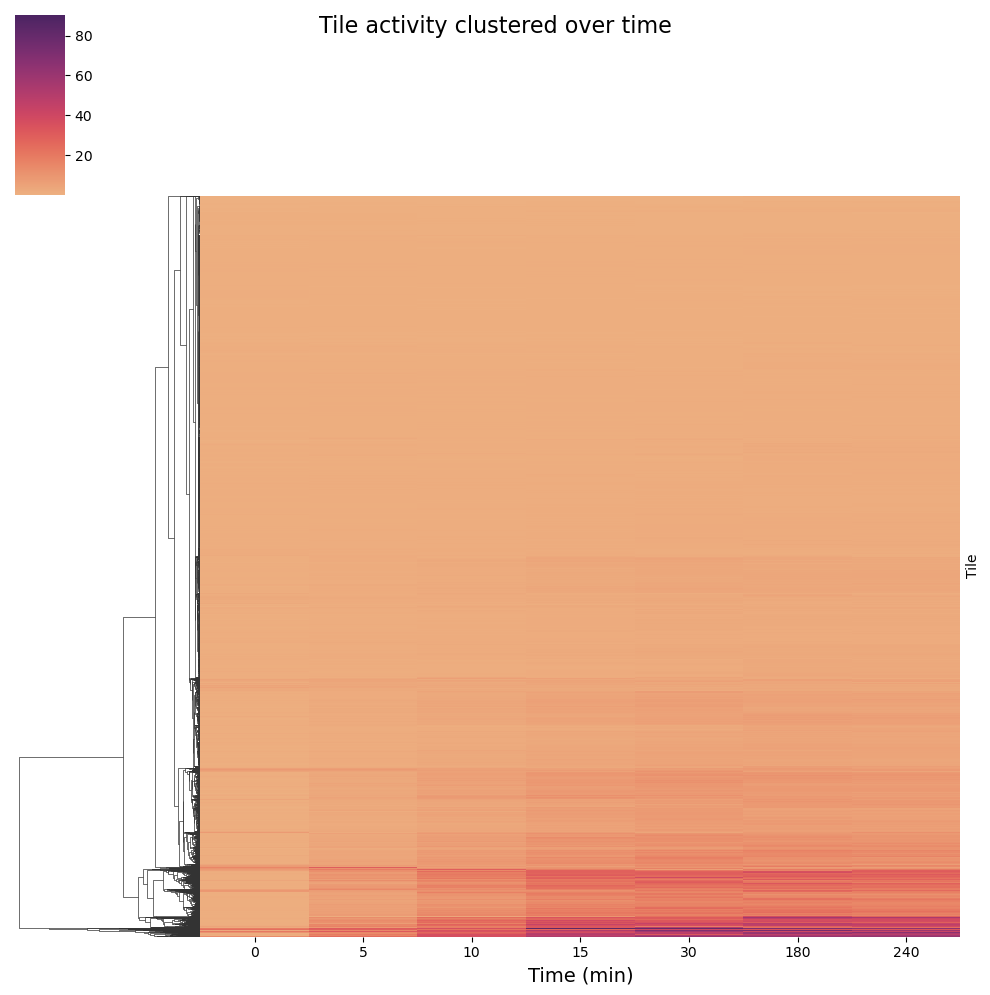

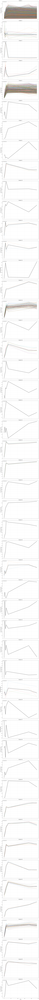

In [8]:
#Clustermap

# Step 1: Create a tile-specific DataFrame for single and multiple samples
cluster_prepdf = intersectiondf.copy(deep=True)


# Step 2: Remove outliers if required
# cluster_prepdf = remove_outliers(cluster_prepdf, group_col='Time', target_col='Ratio_VP16norm')
cluster_prepdf = cluster_prepdf[cluster_prepdf['Ratio_negCTRLnorm']<100]

# Step 3: Calculate metrics for all samples
all_sample_means = cluster_prepdf.groupby(['Tile','Time', 'sample'])['Ratio_negCTRLnorm'].mean().reset_index()
# print(all_sample_means.head(3))
"""
                                                Tile  Time sample     Ratio
0  AAACAAAGAGCTACTCCATTGACTCCAGTTGTTCCAGAATCTGATG...     0      2  1.024773
1  AAACAAAGAGCTACTCCATTGACTCCAGTTGTTCCAGAATCTGATG...     0      3  0.686256
2  AAACAAAGAGCTACTCCATTGACTCCAGTTGTTCCAGAATCTGATG...     0      4  0.892634
"""
all_time_means_tocluster = all_sample_means.groupby(['Time', 'Tile'])['Ratio_negCTRLnorm'].agg(['mean', 'std']).reset_index()
# print(all_time_means_tocluster.head(3))
"""
   Time                                               Tile      mean       std
0     0  AAACAAAGAGCTACTCCATTGACTCCAGTTGTTCCAGAATCTGATG...  0.867888  0.170610
1     0  AAACAAAGATCTCAACCATTGCAACCAATTATTATTGATGATATTA...  0.630991  0.076059
2     0  AAACAAATGTATATTGGTTCTAATAAACCATTGGGTAAAGATCATA...  1.224115  0.040527
"""
# Step 5: Pivot table
cluster_df = pd.pivot_table(all_time_means_tocluster, values='mean', index='Tile', columns=['Time'])
cluster_df = cluster_df.dropna(axis=0)
# print(cluster_df.head(3))
"""
Time                                                     0         5    \ etc
Tile                                                                     
AAACAAAGAGCTACTCCATTGACTCCAGTTGTTCCAGAATCTGATGA...  0.867888  0.397243   
AAACAAAGATCTCAACCATTGCAACCAATTATTATTGATGATATTAA...  0.630991  0.578451   
AAACAAATGTATATTGGTTCTAATAAACCATTGGGTAAAGATCATAG...  1.224115  0.780181  
"""
# t='TTTGTTGCTTCTCCAACATTTAATCATAAATTCTCTTCTTCTAATGCATTTACTACTGAACAAATGAAGACATTTGATCCAGAAGCTGCATTTAATGAATTGTTCTCTCCAGAGTTCTCT'
# cluster_df.loc[t,]



# Step 6: Clustermap
clustermap = sns.clustermap(
    cluster_df, 
    # metric='correlation',
    # z_score = 0,
    # robust=True,
    cmap="flare",  
    col_cluster=False,  
    yticklabels=False, 
    # cbar_kws={"shrink": 0.8}  # Adjust colorbar
)

# Adjust title and labels
clustermap.fig.suptitle('Tile activity clustered over time', fontsize=16)
clustermap.ax_heatmap.set_xlabel('Time (min)', fontsize=14)
# plt.savefig('vp16norm_figs/alldata_clustermap.pdf')
plt.show()


# Step 7: Extract the linkage matrix and determine clusters
linkage_matrix = clustermap.dendrogram_row.linkage
n_clusters = 50  # Define the number of clusters (adjust as needed)
cluster_labels = fcluster(linkage_matrix, t=n_clusters, criterion='maxclust')

# Add cluster labels to the original DataFrame
cluster_df['Cluster'] = cluster_labels

# Step 8: Plot each cluster in a separate subplot
fig, axes = plt.subplots(n_clusters, 1, figsize=(12, 6 * n_clusters), sharex=True)

# Iterate through each cluster and plot the rows
for i in range(1, n_clusters + 1):
    cluster_data = cluster_df[cluster_df['Cluster'] == i].drop(columns=['Cluster'])
    # if i==2:
    #     print(cluster_data.index)
    
    # Plot all rows in the cluster
    for _, row in cluster_data.iterrows():
        axes[i - 1].plot(cluster_data.columns, row.values, alpha=0.5, lw=1)
    
    # Plot the mean line for the cluster
    cluster_mean = cluster_data.mean(axis=0)
    axes[i - 1].plot(cluster_mean.index, cluster_mean.values, color="black", lw=2, label="Mean Line")
    
    # Customize subplot
    axes[i - 1].set_title(f"Cluster {i}", fontsize=16)
    axes[i - 1].set_ylabel("Normalized Ratio", fontsize=14)
    axes[i - 1].grid(alpha=0.3)
    axes[i - 1].legend(loc="upper left")

# Customize x-axis and overall layout
axes[-1].set_xlabel("Time", fontsize=14)
plt.tight_layout()
# plt.savefig('vp16norm_figs/alldata_clusters4.pdf')
plt.show()


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


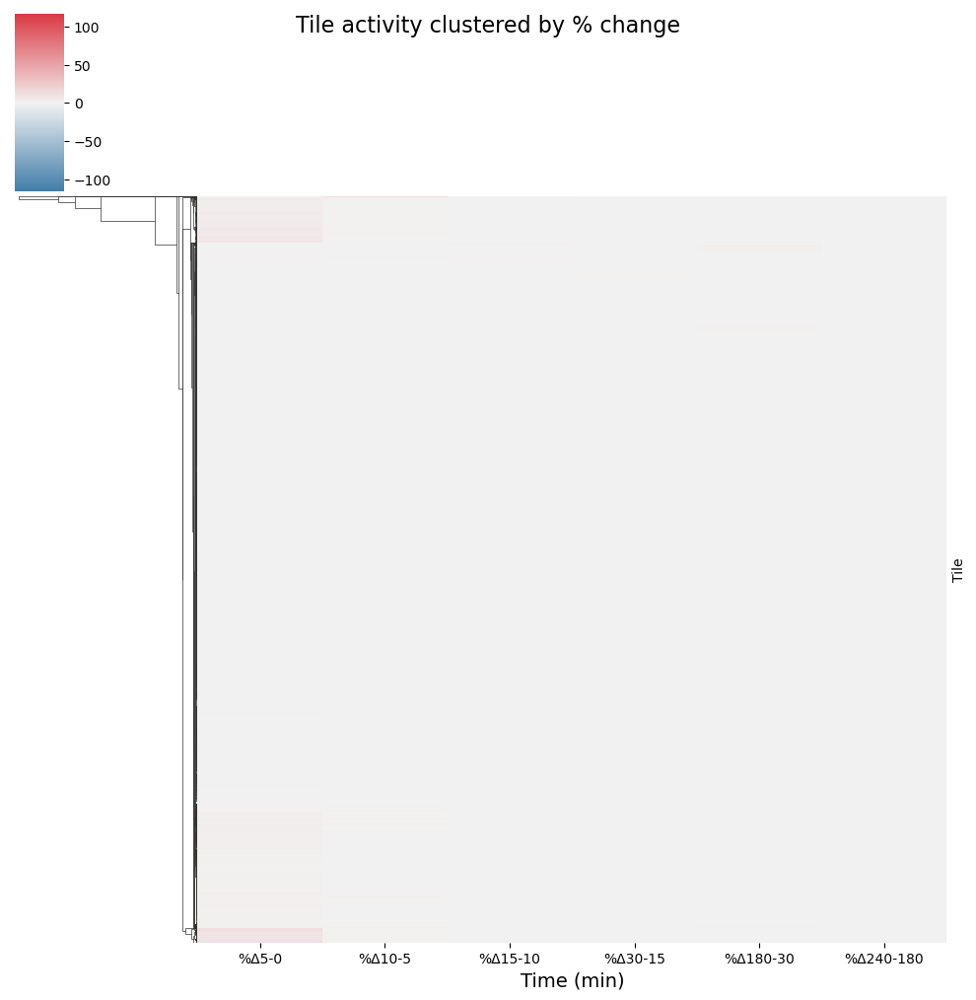

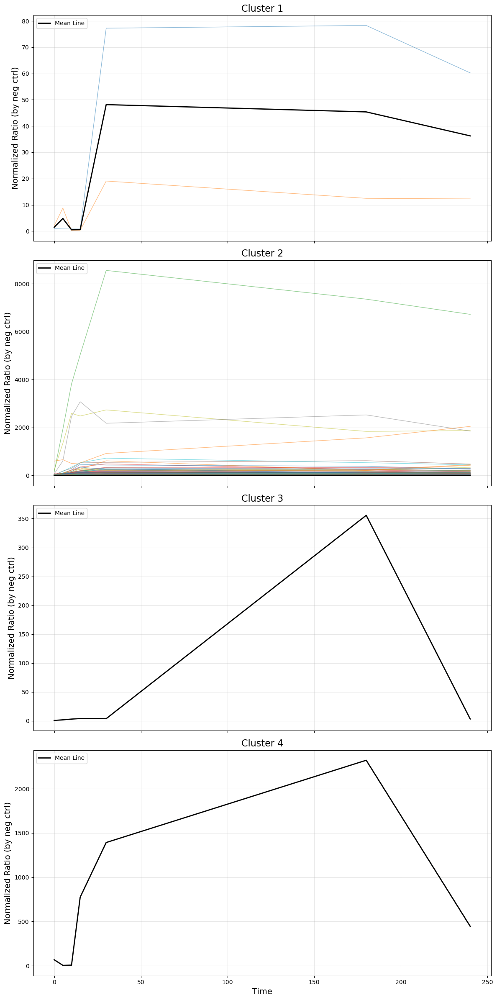

In [32]:
# try with filtered dataset
fil1 = alldata_a_i_grouping.copy(deep=True)
fil1 = fil1.dropna().iloc[:, :7]

# (Optional) Focus on early timepoints
# fil1_early = fil1.iloc[:, :5]

# Step 6: Compute % change between timepoints
df_pct_change_early = fil1.pct_change(axis=1).iloc[:, 1:]
df_pct_change_early.columns = [
    f"%Δ{fil1.columns[i]}-{fil1.columns[i-1]}"
    for i in range(1, len(fil1.columns))
]

# Step 7: Clustermap based on % change
clustermap = sns.clustermap(
    df_pct_change_early, 
    cmap=sns.diverging_palette(240, 10, as_cmap=True),
    center=0,
    col_cluster=False,
    yticklabels=False,
    vmin=-df_pct_change_early.abs().max().max(),
    vmax=df_pct_change_early.abs().max().max()
)

clustermap.fig.suptitle('Tile activity clustered by % change', fontsize=16)
clustermap.ax_heatmap.set_xlabel('Time (min)', fontsize=14)
plt.show()

# Step 8: Extract clusters and apply to original data (fil1_early)
from scipy.cluster.hierarchy import fcluster

linkage_matrix = clustermap.dendrogram_row.linkage
n_clusters = 4
cluster_labels = fcluster(linkage_matrix, t=n_clusters, criterion='maxclust')

# Step 9: Map cluster labels to original data
cluster_labels_df = pd.DataFrame({'Tile': df_pct_change_early.index, 'Cluster': cluster_labels})
fil1_early_filtered = fil1.merge(cluster_labels_df, left_index=True, right_on='Tile')
fil1_early_filtered.set_index('Tile', inplace=True)

# Step 10: Plot original measurements by cluster
fig, axes = plt.subplots(n_clusters, 1, figsize=(12, 6 * n_clusters), sharex=True)
clustered_tiles_early = {}

for i in range(1, n_clusters + 1):
    cluster_data = fil1_early_filtered[fil1_early_filtered['Cluster'] == i].drop(columns=['Cluster'])
    clustered_tiles_early[i] = cluster_data
    
    for _, row in cluster_data.iterrows():
        axes[i - 1].plot(cluster_data.columns, row.values, alpha=0.5, lw=1)
    
    cluster_mean = cluster_data.mean(axis=0)
    axes[i - 1].plot(cluster_mean.index, cluster_mean.values, color="black", lw=2, label="Mean Line")
    axes[i - 1].set_title(f"Cluster {i}", fontsize=16)
    axes[i - 1].set_ylabel("Normalized Ratio (by neg ctrl)", fontsize=14)
    axes[i - 1].grid(alpha=0.3)
    axes[i - 1].legend(loc="upper left")

axes[-1].set_xlabel("Time", fontsize=14)
plt.tight_layout()
plt.show()



/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


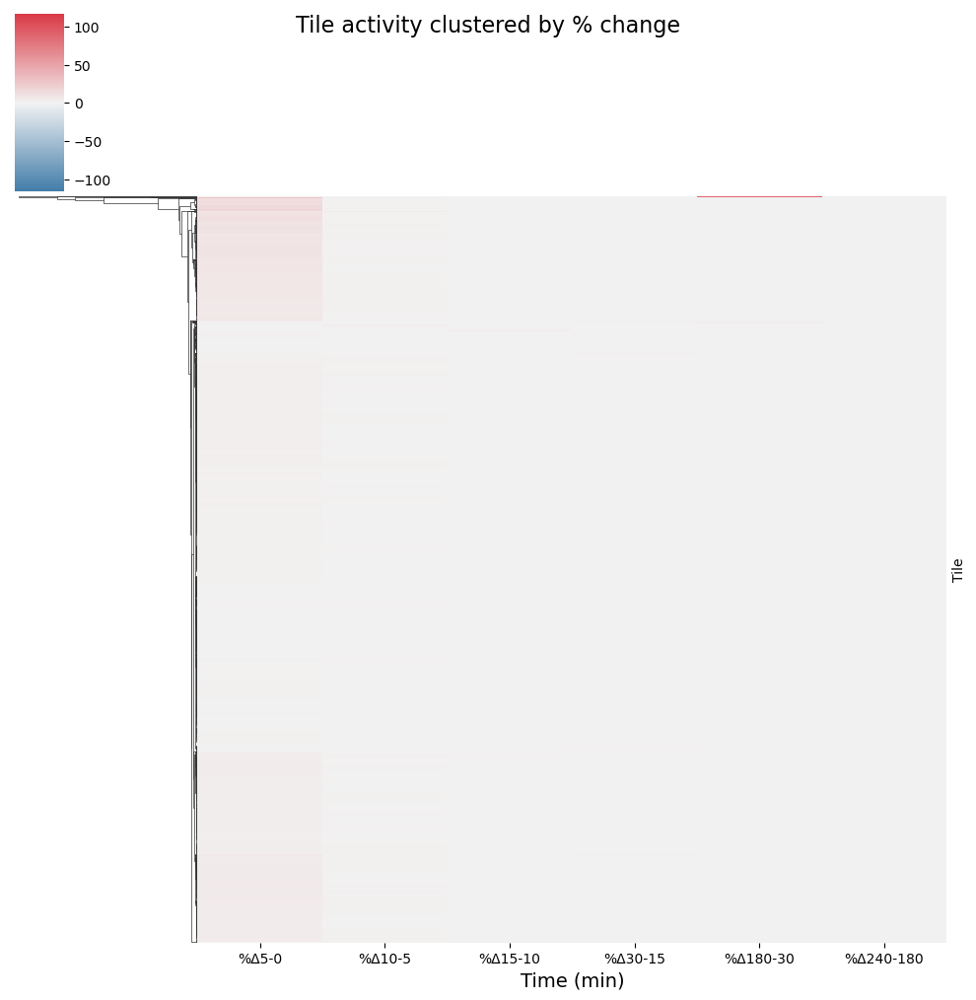

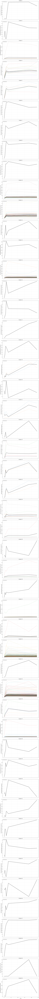

In [28]:
# try with filtered dataset
fil2 = alldata_a_i_grouping.copy(deep=True)
fil2 = fil2[fil2['Activity']!='inactive']
fil2 = fil2.dropna().iloc[:, :7]

# (Optional) Focus on early timepoints
# fil1_early = fil1.iloc[:, :5]

# Step 6: Compute % change between timepoints
df_pct_change_early = fil2.pct_change(axis=1).iloc[:, 1:]
df_pct_change_early.columns = [
    f"%Δ{fil2.columns[i]}-{fil2.columns[i-1]}"
    for i in range(1, len(fil2.columns))
]

# Step 7: Clustermap based on % change
clustermap = sns.clustermap(
    df_pct_change_early, 
    cmap=sns.diverging_palette(240, 10, as_cmap=True),
    center=0,
    col_cluster=False,
    yticklabels=False,
    vmin=-df_pct_change_early.abs().max().max(),
    vmax=df_pct_change_early.abs().max().max()
)

clustermap.fig.suptitle('Tile activity clustered by % change', fontsize=16)
clustermap.ax_heatmap.set_xlabel('Time (min)', fontsize=14)
plt.show()

# Step 8: Extract clusters and apply to original data (fil1_early)
from scipy.cluster.hierarchy import fcluster

linkage_matrix = clustermap.dendrogram_row.linkage
n_clusters = 50
cluster_labels = fcluster(linkage_matrix, t=n_clusters, criterion='maxclust')

# Step 9: Map cluster labels to original data
cluster_labels_df = pd.DataFrame({'Tile': df_pct_change_early.index, 'Cluster': cluster_labels})
fil1_early_filtered = fil2.merge(cluster_labels_df, left_index=True, right_on='Tile')
fil1_early_filtered.set_index('Tile', inplace=True)

# Step 10: Plot original measurements by cluster
fig, axes = plt.subplots(n_clusters, 1, figsize=(12, 6 * n_clusters), sharex=True)
clustered_tiles_early = {}

for i in range(1, n_clusters + 1):
    cluster_data = fil1_early_filtered[fil1_early_filtered['Cluster'] == i].drop(columns=['Cluster'])
    clustered_tiles_early[i] = cluster_data
    
    for _, row in cluster_data.iterrows():
        axes[i - 1].plot(cluster_data.columns, row.values, alpha=0.5, lw=1)
    
    cluster_mean = cluster_data.mean(axis=0)
    axes[i - 1].plot(cluster_mean.index, cluster_mean.values, color="black", lw=2, label="Mean Line")
    axes[i - 1].set_title(f"Cluster {i}", fontsize=16)
    axes[i - 1].set_ylabel("Normalized Ratio (by neg ctrl)", fontsize=14)
    axes[i - 1].grid(alpha=0.3)
    axes[i - 1].legend(loc="upper left")

axes[-1].set_xlabel("Time", fontsize=14)
plt.tight_layout()
plt.show()



# Next

In [12]:
intersectiondf_c = intersectiondf.copy(deep=True)
intersectiondf_c = intersectiondf_c[['Tile', 'Activity_SCglucose']].drop_duplicates()
timeseries_v_facs = final_means_cat.reset_index().merge(intersectiondf_c, on='Tile', how='left').set_index('Tile')
timeseries_v_facs.head()

,0,5,10,15,30,180,240,Vmax,Avg_StdDev,Activity_SCglucose
Tile,,,,,,,,,,
AAACAAAGAGCTACTCCATTGACTCCAGTTGTTCCAGAATCTGATGATCCAGTTGCTTTGAAGAGAGCTAGAAATACTGAAGCTGCTAGAAGATCTAGAGCTAGGAAATTGGAAAGAATG,1.024055,0.765166,0.972441,1.127630,0.705374,1.797263,1.688873,1.797263,0.336801,47271.99999
AAACAAAGATCTCAACCATTGCAACCAATTATTATTGATGATATTAAAGATGCTGCTGCTTTGAAGAGAGCTAAGAATACTGAAGCTGCTAGAAGATCTAGAGCTAGGAAGATGGAAAGA,1.029913,1.114209,1.002584,1.735732,1.223591,0.959030,0.801330,1.735732,0.354514,NaN
AAACAAATGTATATTGGTTCTAATAAACCATTGGGTAAAGATCATAGAGGTTATAATGCTCATAATTGGAAACAATGTGCTATTTACTTTCATATTAGATATCCAAATGTTTCTAATTGT,1.444381,1.502779,1.207199,1.224501,1.079042,2.091113,2.037871,2.091113,0.143566,29467.01591
AAACAACCAGATGTTGCTACTTGGGATGCTCATTCTAATAAAGGTCAATGTTTGTTAAATTCTGGTGGTTCTGCTAGACCATTGATTATTTGGTTGCCACATTCTCACTTTAAAGAATAT,1.887937,2.598463,2.152429,4.301926,4.228287,5.392095,6.407117,6.407117,0.895485,70883.71151
AAACAAGATAAAGATGATGTTACTTCTGAAGTTGCTGATAGAAGATGTAAATCTACTTCTGATTCTCAAGATGTTTATGATAAACCAGGTGAATCTGAATCTCCAGAAAGAACTGAATAT,0.644292,0.893171,0.830069,0.973589,0.773282,1.136462,1.292555,1.292555,0.186757,24891.59769


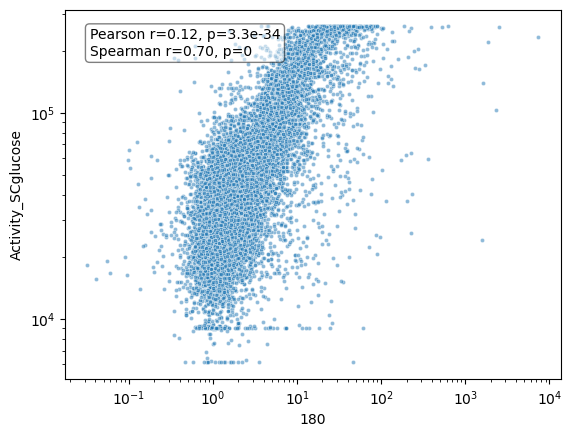

In [20]:
# Combine the relevant columns and drop rows with NaN or inf
valid_data = timeseries_v_facs[[180, 'Activity_SCglucose']].replace([np.inf, -np.inf], np.nan).dropna()

# Extract cleaned x and y
x = valid_data[180]
y = valid_data['Activity_SCglucose']

# Compute correlations
pearson_r, pearson_p = pearsonr(x, y)
spearman_r, spearman_p = spearmanr(x, y)

# Plot
sns.scatterplot(data=valid_data, x=180, y='Activity_SCglucose', 
                marker='.', alpha=0.5)
plt.xscale('log')
plt.yscale('log')

# Annotate
plt.text(
    0.05, 0.95,
    f"Pearson r={pearson_r:.2f}, p={pearson_p:.2g}\nSpearman r={spearman_r:.2f}, p={spearman_p:.2g}",
    transform=plt.gca().transAxes,
    verticalalignment='top',
    bbox=dict(boxstyle="round", facecolor="white", alpha=0.5)
)

plt.show()


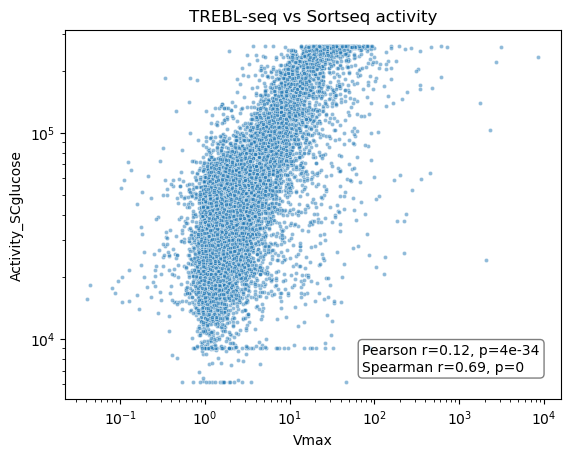

In [31]:
# Combine the relevant columns and drop rows with NaN or inf
valid_data = timeseries_v_facs[['Vmax', 'Activity_SCglucose']].replace([np.inf, -np.inf], np.nan).dropna()

# Extract cleaned x and y
x = valid_data['Vmax']
y = valid_data['Activity_SCglucose']

# Compute correlations
pearson_r, pearson_p = pearsonr(x, y)
spearman_r, spearman_p = spearmanr(x, y)

# Plot
sns.scatterplot(data=valid_data, x='Vmax', y='Activity_SCglucose', 
                marker='.', alpha=0.5)
plt.xscale('log')
plt.yscale('log')

# Annotate
plt.text(
    0.6, 0.15,
    f"Pearson r={pearson_r:.2f}, p={pearson_p:.2g}\nSpearman r={spearman_r:.2f}, p={spearman_p:.2g}",
    transform=plt.gca().transAxes,
    verticalalignment='top',
    bbox=dict(boxstyle="round", facecolor="white", alpha=0.5)
)

plt.title("TREBL-seq vs Sortseq activity")

plt.show()


In [ ]:
def compare_tiles(tiles, dataframe=intersectiondf, save_fig=False):
    """
    Compare the activities of multiple tiles over time on a single plot with error bars.

    Parameters:
    tiles (list): A list of tiles to compare (must have at least two tiles).
    dataframe (pd.DataFrame): Input dataframe containing the data.
    save_fig (bool): Whether to save the figure as a file.

    Returns:
    None
    """
    # Step 1: Validate input
    if len(tiles) < 2:
        raise ValueError("Please provide at least two tiles for comparison.")

    # Step 2: Filter the DataFrame for the specified tiles
    filtered_df = dataframe[dataframe['Tile'].isin(tiles)]

    # Step 3: Group by Tile, Time, and sample, then calculate the mean Ratio_VP16norm for replicates
    sample_means = (
        filtered_df.groupby(['Tile', 'Time', 'sample'])['Ratio_VP16norm']
        .mean()
        .reset_index()
    )

    # Step 4: Calculate the mean and standard deviation of Ratio_VP16norm for each tile and time
    tile_time_stats = (
        sample_means.groupby(['Tile', 'Time'])['Ratio_VP16norm']
        .agg(['mean', 'std'])
        .reset_index()
        .rename(columns={'mean': 'mean_Ratio', 'std': 'std_Ratio'})
    )

    # Step 5: Map Tile to Name for labeling
    tile_to_name = filtered_df.groupby('Tile')['Name'].first().to_dict()

    # Step 6: Create the plot
    plt.figure(figsize=(12, 8))
    sns.set(style="whitegrid")

    # Plot each tile
    # tile_names_ctrls = []
    for tile in tiles:
        # tile_names_ctrls.append(tile_to_name[tile])
        tile_data = tile_time_stats[tile_time_stats['Tile'] == tile]
        plt.errorbar(
            tile_data['Time'],
            tile_data['mean_Ratio'],
            yerr=tile_data['std_Ratio'],
            fmt='o-',
            capsize=5,
            label=f'Name: {tile_to_name[tile]}',  # Use Name as the label
            alpha=0.8
        )

    # Step 7: Customize the plot
    plt.title('Comparison of Tiles Over Time', fontsize=14, fontweight='bold')
    plt.xlabel('Time', fontsize=12)
    plt.ylabel('Mean Ratio_VP16norm ± Std Dev', fontsize=12)
    plt.legend(title='Tile', fontsize=10, title_fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)

    # Save the figure if requested
    if save_fig:
        tile_names = "-".join([str(tile_to_name[tile]) for tile in tiles])
        print(f'saved to vp16norm_figs/timeseries/trace_comparison/tile_comparison_{tile_names}.pdf')
        plt.savefig(f'vp16norm_figs/timeseries/trace_comparison/tile_comparison_{tile_names}.pdf', dpi=300, bbox_inches='tight')
#
    plt.show()
